In [ ]:
# Install necessary packages
!pip install chembl_webresource_client tensorflow numpy pandas matplotlib seaborn rdkit keras-tuner scikit-learn
!pip install rdkit
!pip install xgboost
!pip install lightgbm
!pip install pubchempy
!pip install lazypredict
!pip install mordred

## Importing necessary libraries

In [ ]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from glob import glob

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Importing necessary modules from the RDKit library
# Importing the Chem module for basic chemistry functions
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Descriptors
from rdkit.Chem import AllChem, PandasTools, MACCSkeys, AtomPairs, rdFingerprintGenerator
from rdkit import DataStructs
from rdkit.Chem.rdmolops import PatternFingerprint
from rdkit.Avalon import pyAvalonTools
from rdkit.Chem.AtomPairs.Pairs import GetAtomPairFingerprintAsBitVect
pd.set_option('display.max_rows', None)

# Importing various submodules from rdkit.Chem for chemical descriptors and fingerprints
from rdkit.Chem import Descriptors   # For calculating molecular descriptors
from rdkit.Chem import MACCSkeys      # For generating MACCS keys fingerprints
from rdkit.Chem import AllChem          # For various chemical functions, including fingerprint generation
from rdkit.Chem import rdMolDescriptors   # For calculating more advanced molecular descriptors

# Importing the Fingerprinter class from rdkit.Chem.EState for EState fingerprints
from rdkit.Chem.EState import Fingerprinter as EStateFingerprinter

# Library to split data in train and test
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
import xgboost as xgb
import lightgbm as lgb
import pubchempy as pcp
from rdkit.Chem import Crippen

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
    matthews_corrcoef,
    r2_score
)

import warnings
warnings.filterwarnings("ignore")

# Importing the new_client module from the ChEMBL web resource client library
# The ChEMBL web resource client is used to access the ChEMBL database, a large bioactivity database
from chembl_webresource_client.new_client import new_client


from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score, roc_auc_score, matthews_corrcoef
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier # Import MLPClassifier


from rdkit.Chem import AllChem, rdFingerprintGenerator

import mordred
from mordred import Calculator, descriptors
pd.set_option('display.max_columns', 2000)
warnings.filterwarnings("ignore")
sns.set(style='whitegrid')


## Virtual Screening

#### Load dataset from LOTUS Database



In [ ]:
import pandas as pd

file_path = '/content/LOTUS_DB.smi'

# Attempt to read the file, assuming it could be either Excel or text
try:
    if file_path.endswith('.xlsx') or file_path.endswith('.xls'):  # If it's an Excel file
        new_data = pd.read_excel(file_path)
    elif file_path.endswith('.smi'):  # If it's a SMILES text file
        new_data = pd.read_csv(file_path, sep='\t', header=None)  # Adjust separator if needed
        # Optional: Rename columns if the file has no headers
        new_data.columns = ['SMILES', 'Name']  # Adjust based on file format
    else:
        raise ValueError("Unsupported file format.")
    print("File read successfully!")
    print(new_data.head())  # Display the first few rows of the data
except Exception as e:
    print(f"Error reading file: {e}")


File read successfully!
                                              SMILES        Name
0  CO[C@H](C=C(C)C)C[C@@H](C)[C@H]1CC[C@@]2(C)[C@...  LTS0257199
1  CC(=O)OC1C(OC2C(OC3CC(O)CC4=CCC5C6CC7OC8(CCC(C...  LTS0124597
2  C[C@H](CO)[C@H]1OC(=O)C=C2C1=C[C@H]1OC(=O)[C@]...  LTS0121510
3                                    CS(=O)(=O)C=CCO  LTS0110032
4             COc1cccc2c1C(=O)O[C@H](CCC[C@H](C)O)C2  LTS0103990


In [ ]:
new_data

,0,1
0,CO[C@H](C=C(C)C)C[C@@H](C)[C@H]1CC[C@@]2(C)[C@...,LTS0257199
1,CC(=O)OC1C(OC2C(OC3CC(O)CC4=CCC5C6CC7OC8(CCC(C...,LTS0124597
2,C[C@H](CO)[C@H]1OC(=O)C=C2C1=C[C@H]1OC(=O)[C@]...,LTS0121510
3,CS(=O)(=O)C=CCO,LTS0110032
4,COc1cccc2c1C(=O)O[C@H](CCC[C@H](C)O)C2,LTS0103990
5,CC1C(=O)OC2(C)C1C(=O)OC1CCN3CC=C(COC(=O)C2(C)O...,LTS0116501
6,CC1=CC(=O)[C@H](O)[C@@]2(C)C[C@H]3OC(=O)C(C)=C...,LTS0256634
7,CCCCCCCCCCCC[C@H](O)[C@H]1CC[C@@H]([C@H](O)CCC...,LTS0039360
8,C[C@H]1[C@H]2[C@H](C[C@H]3[C@@H]4CC=C5C[C@@H](...,LTS0120344
9,CC(C)CCCC(O)CCC(O)CC(=O)O,LTS0126799


In [ ]:
import pandas as pd

try:
  new_data = pd.read_excel('/content/LOTUS_DB.smi')  # Try default settings first
except Exception as e:
  print(f"Error reading Excel file: {e}")


In [ ]:
import pandas as pd

if 'new_data' in locals():
    # Randomly select 1400 rows
    new_data = new_data.sample(n=1400, random_state=42)  # Set random_state for reproducibility

    # Display the sampled data
    print(new_data)

    # Save to a new Excel file
    new_file_path = '/content/LOTUS_DB_sampled.xlsx'  # Change file extension to .xlsx
    new_data.to_excel(new_file_path, index=False)
    print(f"Sampled data saved to {new_file_path}")
else:
    print("Data could not be loaded.")


                                                  SMILES        Name
28116  COc1cc(-c2cc(=O)c3c(O)c(OC)c(OC4OC(COC(=O)CC(C...  LTS0020495
3047   C[C@@H]1O[C@@H](O[C@H]2CC[C@@]3(C)C(=CC[C@H]4[...  LTS0245926
12073  C=C1CCCC(C)(C)[C@@H]1CC/C(C)=C/CC/C(C)=C/Cn1c[...  LTS0105377
14945  COc1cc2c(cc1O)oc(=O)c1c2c(-c2ccc(O)c(O)c2)c2n1...  LTS0041952
20486              CC(C)C1CCC2C(=CCC3C(C)(CO)CCCC23C)C1O  LTS0028053
14636            CN(CCc1ccc2c(c1)OCO2)C(=O)/C=C/c1ccccc1  LTS0234219
32342  CC(=O)[C@@H]1C[C@H]2C(C)(C)CCC[C@]2(C)[C@@]1(O...  LTS0237270
11816                CC(C)C12C=C3C(C)(O)CCC3(OO1)C(C)CC2  LTS0252939
11131  C[C@H]1C(=O)N2c3ccccc3[C@@]3(O)C[C@@H]4C(O)=N[...  LTS0243584
200    CC(O)=NC(C)C1CCC2(C)C3CCC4C(CCC(N(C)C)C4(C)C)C...  LTS0107886
16487        O=C(O)C1OC(OC2C(O)C(O)OC(CO)C2O)C(O)C(O)C1O  LTS0039033
16229          COC1C=CC(C)(O)C=CC(=O)OC(C)C(C)C(O)CC=C1C  LTS0251129
2275    CC1C2CCC3C4CCC5=CC(=O)C=CC5(C)C4C(O)CC32C(O)N1CO  LTS0036458
14584  O=C1[C@H](Cc2ccc(O)cc2)N=C(

#### Load Stacking Ensemble model and virtual screening

In [ ]:
from rdkit.Chem import MACCSkeys, rdMolDescriptors, RDKFingerprint
import joblib
import pubchempy as pcp

# Load the trained stacked model
stacking_classifier = joblib.load('/content/stacking_classifier (1).pkl')


In [ ]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import MACCSkeys, rdMolDescriptors, RDKFingerprint
import joblib
import pubchempy as pcp

# Load the trained stacked model
stacking_classifier = joblib.load('/content/stacking_classifier (1).pkl')

# Fingerprint generation functions
def get_maccs_keys(mol):
    return list(MACCSkeys.GenMACCSKeys(mol))

def get_2d_atom_pair_fp(mol):
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol))

def get_cdk_fp(mol):
    return list(rdMolDescriptors.GetHashedTopologicalTorsionFingerprintAsBitVect(mol))

def get_cdk_extended_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=3, nBits=2048))

def get_cdk_graph_fp(mol):
    return list(RDKFingerprint(mol))

def get_circle_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048))

def get_hybrid_fp(mol):
    return list(rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, useChirality=True, nBits=2048))

def get_klekota_roth_fp(mol):
    return list(rdMolDescriptors.GetHashedAtomPairFingerprintAsBitVect(mol, nBits=2048))

def get_pubchem_fp(mol):
    try:
        smiles = Chem.MolToSmiles(mol)
        compound = pcp.get_compounds(smiles, 'smiles')[0]
        fingerprint = compound.cactvs_fingerprint
        return np.array([int(bit) for bit in fingerprint])
    except Exception as e:
        print(f"Error fetching PubChem fingerprint: {e}")
        return np.nan

def safe_get_fingerprint(func, mol):
    """Safely compute fingerprint, handle exceptions."""
    try:
        fingerprint = func(mol)
        if fingerprint is None:
            return np.nan
        return fingerprint
    except Exception as e:
        print(f"Error generating fingerprint: {e}")
        return np.nan

# Dictionary mapping fingerprint types to functions
fingerprint_functions = {
    'MACCS': get_maccs_keys,
    '2D Atom Pair': get_2d_atom_pair_fp,
    'CDK': get_cdk_fp,
    'CDK Extended': get_cdk_extended_fp,
    'CDK Graph': get_cdk_graph_fp,
    'Circle': get_circle_fp,
    'Hybrid': get_hybrid_fp,
    'Klekota-Roth': get_klekota_roth_fp,
    'Pubchem': get_pubchem_fp
}

def generate_fingerprint_dataframes(new_data, fingerprint_functions):
    """Generate fingerprints and store them in separate DataFrames."""
    separate_dfs = {}
    for name, func in fingerprint_functions.items():
        print(f"Generating fingerprints for {name}")
        new_data[f'{name}_FP'] = new_data['mol'].apply(lambda mol: safe_get_fingerprint(func, mol))
        fingerprint_data = new_data[f'{name}_FP'].apply(pd.Series)
        separate_dfs[f'{name}_FP'] = fingerprint_data.fillna(0)  # Replace NaN with 0
    return separate_dfs

# Load the Natural Product Atlas data
input_file = '/content/LOTUS_DB_sampled.xlsx'  # Adjust file path as necessary
output_file = 'Virtual_Screening_Results.csv'

try:
    np_atlas_data = pd.read_excel(input_file)
    np_atlas_data['mol'] = np_atlas_data['SMILES'].apply(Chem.MolFromSmiles)
    print("Molecules loaded successfully.")
except Exception as e:
    raise ValueError(f"Error loading input file: {e}")

# Generate fingerprints
separate_fingerprints = generate_fingerprint_dataframes(np_atlas_data, fingerprint_functions)
combined_fingerprint_data = pd.concat(separate_fingerprints.values(), axis=1)

# Check feature consistency
expected_features = stacking_classifier.n_features_in_
if combined_fingerprint_data.shape[1] != expected_features:
    raise ValueError(f"Feature dimension mismatch. Model expects {expected_features}, but input has {combined_fingerprint_data.shape[1]}.")

# Perform predictions
try:
    predictions = stacking_classifier.predict(combined_fingerprint_data)
    probabilities = stacking_classifier.predict_proba(combined_fingerprint_data)[:, 1]
    np_atlas_data['Prediction'] = predictions
    np_atlas_data['Probability'] = probabilities
    np_atlas_data.to_csv(output_file, index=False)
    print(f"Virtual screening completed. Results saved to {output_file}.")
    print(np_atlas_data[['Smiles', 'Prediction', 'Probability']].head())
except Exception as e:
    raise RuntimeError(f"Error during prediction: {e}")


##### finding solution

In [ ]:
def safe_get_fingerprint(func, mol):
    """Safely compute fingerprint, handle exceptions."""
    try:
        fingerprint = func(mol)
        if fingerprint is None:
            return np.nan
        print(f"Fingerprint length: {len(fingerprint)}")  # Debugging
        return fingerprint
    except Exception as e:
        print(f"Error generating fingerprint: {e}")
        return np.nan


In [ ]:
# Remove rows with invalid molecules
np_atlas_data = np_atlas_data[np_atlas_data['mol'].notnull()]
print(f"Valid molecules: {len(np_atlas_data)}")


Valid molecules: 1400


In [ ]:
def pad_features(input_df, expected_features):
    """Pad or truncate features to match expected dimensions."""
    current_features = input_df.shape[1]
    if current_features < expected_features:
        # Add missing columns with zeros
        for i in range(current_features, expected_features):
            input_df[f'padding_{i}'] = 0
    elif current_features > expected_features:
        # Truncate extra columns
        input_df = input_df.iloc[:, :expected_features]
    return input_df

combined_fingerprint_data = pad_features(combined_fingerprint_data, expected_features)


In [ ]:
for name, df in separate_fingerprints.items():
    print(f"{name}: {df.shape[1]} features")


MACCS_FP: 167 features
2D Atom Pair_FP: 2048 features
CDK_FP: 2048 features
CDK Extended_FP: 2048 features
CDK Graph_FP: 2048 features
Circle_FP: 2048 features
Hybrid_FP: 2048 features
Klekota-Roth_FP: 2048 features
Pubchem_FP: 881 features


In [ ]:
np_atlas_data['Pubchem_FP'].apply(lambda x: len(x) if x is not np.nan else 0).value_counts()


,count
Pubchem_FP,
881,1381
0,19


In [ ]:
max_len = 881  # Target length based on the majority

# Apply the transformation, checking for NaN or non-list values
np_atlas_data['Pubchem_FP'] = np_atlas_data['Pubchem_FP'].apply(
    lambda x: (x if isinstance(x, list) else []) + [0] * (max_len - len(x)) if isinstance(x, list) and len(x) < max_len
              else x[:max_len] if isinstance(x, list)
              else []
)


In [ ]:
def pad_features(input_df, expected_features):
    current_features = input_df.shape[1]
    if current_features < expected_features:
        for i in range(current_features, expected_features):
            input_df[f'padding_{i}'] = 0
    return input_df

combined_fingerprint_data = pad_features(combined_fingerprint_data, 15542)


In [ ]:
for name in fingerprint_functions.keys():
    null_count = np_atlas_data[f'{name}_FP'].isnull().sum()
    print(f"{name} fingerprints: {null_count} nulls")


MACCS fingerprints: 0 nulls
2D Atom Pair fingerprints: 0 nulls
CDK fingerprints: 0 nulls
CDK Extended fingerprints: 0 nulls
CDK Graph fingerprints: 0 nulls
Circle fingerprints: 0 nulls
Hybrid fingerprints: 0 nulls
Klekota-Roth fingerprints: 0 nulls
Pubchem fingerprints: 0 nulls


In [ ]:
np_atlas_data = np_atlas_data.dropna(subset=[f'{name}_FP' for name in fingerprint_functions.keys()])


In [ ]:
missing_features = 15542 - 15384  # = 158 features missing
print(f"Missing Features: {missing_features}")


Missing Features: 158


In [ ]:
expected_feature_lengths = {
    'MACCS': 167,
    '2D Atom Pair': 2048,
    'CDK': 2048,
    'CDK Extended': 2048,
    'CDK Graph': 2048,
    'Circle': 2048,
    'Hybrid': 2048,
    'Klekota-Roth': 2048,
    'Pubchem': 881
}


In [ ]:
for name, expected_len in expected_feature_lengths.items():
    np_atlas_data[f'{name}_FP'] = np_atlas_data[f'{name}_FP'].apply(
        lambda x: x + [0] * (expected_len - len(x)) if x is not np.nan and len(x) < expected_len else x
    )


In [ ]:
combined_fingerprint_data = pd.concat(
    [pd.DataFrame(np_atlas_data[f'{name}_FP'].tolist()) for name in fingerprint_functions.keys()],
    axis=1
)

print(f"Final feature count: {combined_fingerprint_data.shape[1]}")


Final feature count: 15384


In [ ]:
def pad_to_match(df, expected_features):
    current_features = df.shape[1]
    for i in range(current_features, expected_features):
        df[f'padding_{i}'] = 0
    return df

combined_fingerprint_data = pad_to_match(combined_fingerprint_data, 15542)


In [ ]:
combined_fingerprint_data.columns = combined_fingerprint_data.columns.astype(str)


#### Virtual Screening

In [ ]:
try:
    predictions = stacking_classifier.predict(combined_fingerprint_data)
    probabilities = stacking_classifier.predict_proba(combined_fingerprint_data)[:, 1]
    np_atlas_data['Prediction'] = predictions
    np_atlas_data['Probability'] = probabilities
    np_atlas_data.to_csv(output_file, index=False)
    print(f"Virtual screening completed. Results saved to {output_file}.")
except Exception as e:
    raise RuntimeError(f"Error during prediction: {e}")


Virtual screening completed. Results saved to Virtual_Screening_Results.csv.


In [ ]:
import pandas as pd
from google.colab import drive

# Mount your Google Drive to Google Colab
drive.mount('/content/drive')

# Define the output file path
output_file = '/content/drive/MyDrive/Virtual_Screening_Results.csv'

try:
  predictions = stacking_classifier.predict(combined_fingerprint_data)
  probabilities = stacking_classifier.predict_proba(combined_fingerprint_data)[:, 1]
  np_atlas_data['Prediction'] = predictions
  np_atlas_data['Probability'] = probabilities
  np_atlas_data.to_csv(output_file, index=False)
  print(f"Virtual screening completed. Results saved to {output_file}.")
except Exception as e:
  raise RuntimeError(f"Error during prediction: {e}")


Mounted at /content/drive
Virtual screening completed. Results saved to /content/drive/MyDrive/Virtual_Screening_Results.csv.


In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
import pandas as pd

try:
    # Perform predictions
    predictions = stacking_classifier.predict(combined_fingerprint_data)
    probabilities = stacking_classifier.predict_proba(combined_fingerprint_data)[:, 1]

    # Add predictions and probabilities to the DataFrame
    np_atlas_data['Prediction'] = predictions
    np_atlas_data['Probability'] = probabilities

    # Save results to a CSV file
    np_atlas_data.to_csv(output_file, index=False)
    print(f"Virtual screening completed. Results saved to {output_file}.")

except Exception as e:
    raise RuntimeError(f"Error during prediction: {e}")

# Filter for predicted class 1 (active molecules)
prediction_df = np_atlas_data
smile_predicted_1 = prediction_df[prediction_df['Prediction'] == 1]

# Display the filtered DataFrame
print(smile_predicted_1)


Virtual screening completed. Results saved to /content/drive/MyDrive/Virtual_Screening_Results.csv.
                                                 SMILES        Name  \
14    C=C1C(O)=N[C@H](C)C(O)=N[C@@H](CCCc2ccc(O)cc2)...  LTS0243360   
31    COC(O)=N[C@@H]1[C@@H](C)O[C@@H](O[C@H]2C/C=C(/...  LTS0028290   
88    CC1OC(OC2C(CO)OC(OCC3OC(OC(=O)C45CCC(C)(C)CC4C...  LTS0120686   
257   CC(C)CC(OC1OC(CO)C(O)C(O)C1O)(C(=O)OCc1ccc(OC2...  LTS0101233   
265   C[C@@H]1O[C@H](O[C@H]2[C@H](CO)O[C@H](OC[C@@H]...  LTS0246329   
283   CC(O)=NC(C)(C)C(O)=NC(CO)C(O)=NC(C)C(O)=NC(C)(...  LTS0254301   
381   CO[C@@H]1[C@@H](O)[C@H](O[C@@H]2[C@@H](O)[C@H]...  LTS0112542   
399   COc1cc(OC)c2c(c1)O[C@@]1(c3ccc4c(c3)OCO4)[C@H]...  LTS0040377   
420   COC(=O)CC1C(C)(C)C(OC(C)=O)C2(O)C(=O)C1(C)C1CC...  LTS0021795   
434   COC1C(O)C(CO)OC(OC2C(O)C(CO)OC(OC3C(C)OC(OC4C(...  LTS0025402   
450   COC(=O)/C(C)=C1\C(=O)[C@H](O)C2(C)C3=C(C[C@@H]...  LTS0089948   
464   CC(=O)O[C@H]1[C@H](O[C@H]2CC[C@]3(C)[C@@H]

In [ ]:
smile_predicted_1

,SMILES,Name,mol,MACCS_FP,2D Atom Pair_FP,CDK_FP,CDK Extended_FP,CDK Graph_FP,Circle_FP,Hybrid_FP,Klekota-Roth_FP,Pubchem_FP,Prediction,Probability
14,C=C1C(O)=N[C@H](C)C(O)=N[C@@H](CCCc2ccc(O)cc2)...,LTS0243360,<rdkit.Chem.rdchem.Mol object at 0x7ecc93e197e0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.560321
31,COC(O)=N[C@@H]1[C@@H](C)O[C@@H](O[C@H]2C/C=C(/...,LTS0028290,<rdkit.Chem.rdchem.Mol object at 0x7ecc93e19070>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.585728
88,CC1OC(OC2C(CO)OC(OCC3OC(OC(=O)C45CCC(C)(C)CC4C...,LTS0120686,<rdkit.Chem.rdchem.Mol object at 0x7ecc93df8ac0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.528428
257,CC(C)CC(OC1OC(CO)C(O)C(O)C1O)(C(=O)OCc1ccc(OC2...,LTS0101233,<rdkit.Chem.rdchem.Mol object at 0x7ecc93d92420>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.567569
265,C[C@@H]1O[C@H](O[C@H]2[C@H](CO)O[C@H](OC[C@@H]...,LTS0246329,<rdkit.Chem.rdchem.Mol object at 0x7ecc93d920a0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, ...","[1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.570699
283,CC(O)=NC(C)(C)C(O)=NC(CO)C(O)=NC(C)C(O)=NC(C)(...,LTS0254301,<rdkit.Chem.rdchem.Mol object at 0x7ecc93d91850>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...","[0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,0.625802
381,CO[C@@H]1[C@@H](O)[C@H](O[C@@H]2[C@@H](O)[C@H]...,LTS0112542,<rdkit.Chem.rdchem.Mol object at 0x7ecc93d82ab0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0

In [ ]:
smile_predicted_1.shape

(58, 14)

In [ ]:
smile_predicted_1.to_csv('smile_predicted_ACTIVE.csv', index=False)

In [ ]:
# Filter for predicted class 1 (active molecules)
smile_predicted_1 = prediction_df[prediction_df['Prediction'] == 1]

# Sort by probabilities in descending order and get the top 10
top_10_smiles = smile_predicted_1.sort_values(by='Probability', ascending=False).head(10)

# Display the top 10 rows
print(top_10_smiles)


                                                 SMILES        Name  \
468   C=C1CO[C@]2(O[C@@H]3C[C@H]4[C@@H]5CC=C6C[C@@H]...  LTS0018034   
1128  C[C@@H]1O[C@H](OC(=O)[C@]23CCC(C)(C)C[C@H]2C2=...  LTS0131923   
420   COC(=O)CC1C(C)(C)C(OC(C)=O)C2(O)C(=O)C1(C)C1CC...  LTS0021795   
1267  C[C@@H]1O[C@@H](O[C@H]2[C@H](OC(=O)[C@]34CCC(C...  LTS0258251   
283   CC(O)=NC(C)(C)C(O)=NC(CO)C(O)=NC(C)C(O)=NC(C)(...  LTS0254301   
450   COC(=O)/C(C)=C1\C(=O)[C@H](O)C2(C)C3=C(C[C@@H]...  LTS0089948   
467   CC1OC(OC2C(O)C(CO)OC(OC3COC(OC4CCC5(C)C(CCC6(C...  LTS0244127   
971   COC(=O)CO[C@@H](O[C@H]1[C@H](O)[C@@H](C(=O)O)O...  LTS0042614   
1146  C/C=C\[C@H]1C[C@H]2C(=O)O[C@H](C)[C@@H](N=C(O)...  LTS0019856   
840   C[C@H](O)CC(=O)O[C@@H](C)CC(=O)O[C@@H](C)CC(=O...  LTS0273393   

                                                   mol  \
468   <rdkit.Chem.rdchem.Mol object at 0x7ecc93d80200>   
1128  <rdkit.Chem.rdchem.Mol object at 0x7ecc95891230>   
420   <rdkit.Chem.rdchem.Mol object at 0x7ec

In [ ]:
top_10_smiles.to_csv('top_10_ACTIVE.csv', index=False)

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw

# Create molecule objects from SMILES
molecules = [Chem.MolFromSmiles(smile) for smile in top_10_smiles['SMILES']]

# Generate labels combining `Name` and `Probability`
legends = [f"{npaid}\nProb: {prob:.2f}" for npaid, prob in zip(top_10_smiles['Name'], top_10_smiles['Probability'])]

# Create a grid image with labeled molecules as a PIL.Image
img = Draw.MolsToImage(
    mols=molecules,
    legends=legends,
    subImgSize=(200, 200)
)

# Save the image to a file
img.save("top_10_molecules.png")
print("Molecular grid saved as 'top_10_molecules.png'")



Molecular grid saved as 'top_10_molecules.png'


#### Structure of top 10 active

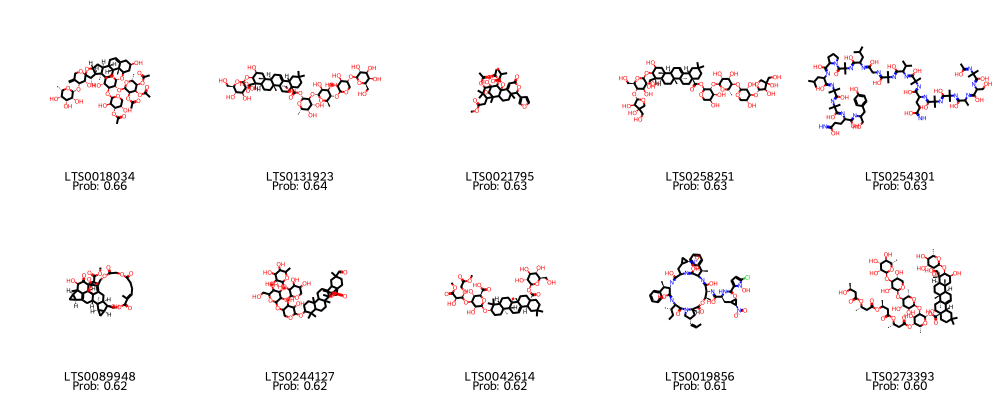

In [ ]:
from rdkit.Chem import Draw

# Create molecule objects from SMILES
molecules = [Chem.MolFromSmiles(smile) for smile in top_10_smiles['SMILES']]

# Generate labels combining `npaid` and `Probability`
legends = [f"{npaid}\nProb: {prob:.2f}" for npaid, prob in zip(top_10_smiles['Name'], top_10_smiles['Probability'])]

# Create a grid image with labeled molecules
img = Draw.MolsToGridImage(molecules, molsPerRow=5, subImgSize=(200, 200), legends=legends)

# Display the image in the notebook
img


In [ ]:
ACTIVES = pd.read_csv('/content/smile_predicted_ACTIVE.csv')

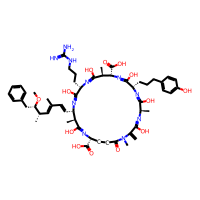

LTS0243360
Prob: 0.56


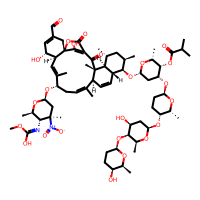

LTS0028290
Prob: 0.59


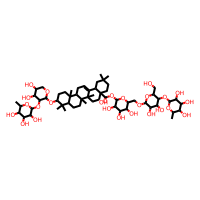

LTS0120686
Prob: 0.53


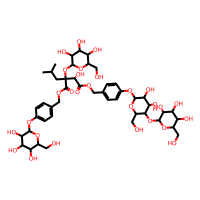

LTS0101233
Prob: 0.57


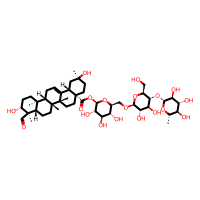

LTS0246329
Prob: 0.57


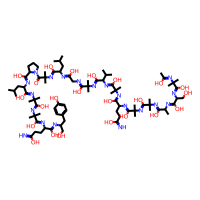

LTS0254301
Prob: 0.63


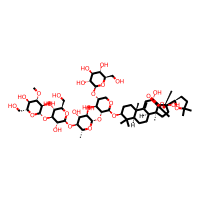

LTS0112542
Prob: 0.52


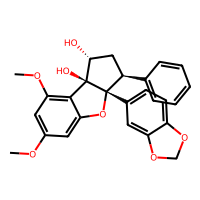

LTS0040377
Prob: 0.50


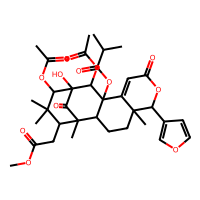

LTS0021795
Prob: 0.63


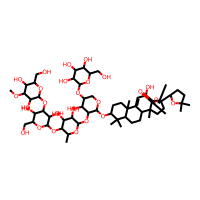

LTS0025402
Prob: 0.54


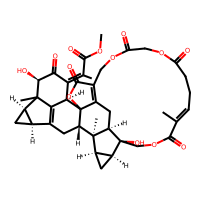

LTS0089948
Prob: 0.62


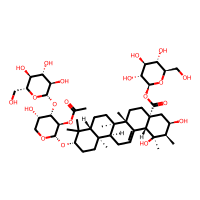

LTS0048401
Prob: 0.59


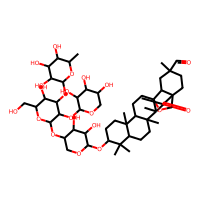

LTS0244127
Prob: 0.62


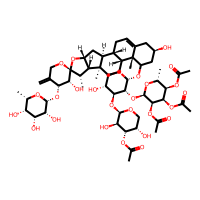

LTS0018034
Prob: 0.66


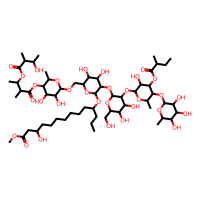

LTS0231902
Prob: 0.52


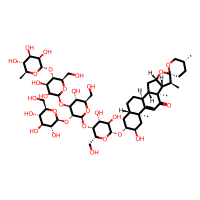

LTS0256524
Prob: 0.54


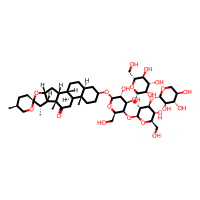

LTS0235315
Prob: 0.53


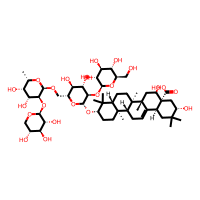

LTS0078367
Prob: 0.53


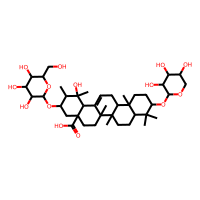

LTS0045604
Prob: 0.53


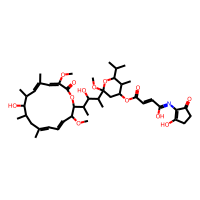

LTS0105780
Prob: 0.60


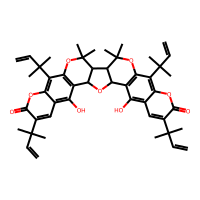

LTS0047200
Prob: 0.53


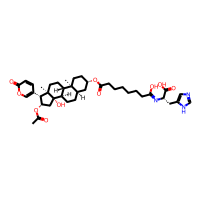

LTS0226768
Prob: 0.57


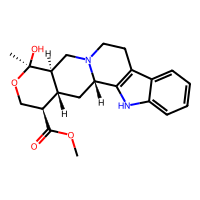

LTS0014536
Prob: 0.53


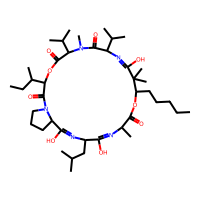

LTS0137120
Prob: 0.55


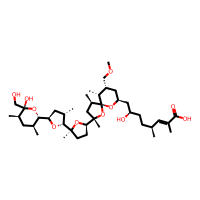

LTS0109098
Prob: 0.51


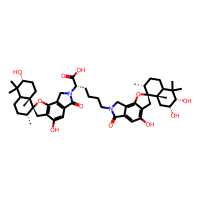

LTS0096272
Prob: 0.57


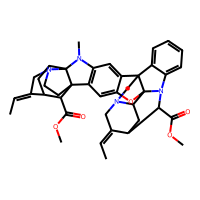

LTS0107124
Prob: 0.53


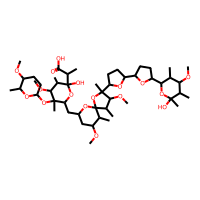

LTS0044108
Prob: 0.52


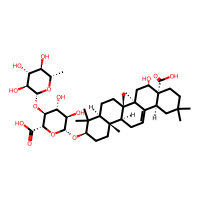

LTS0033342
Prob: 0.53


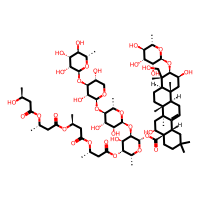

LTS0273393
Prob: 0.60


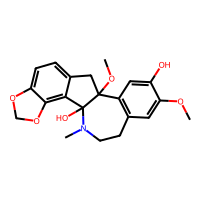

LTS0023454
Prob: 0.50


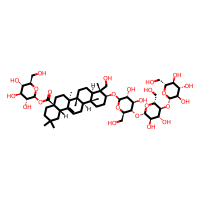

LTS0030666
Prob: 0.59


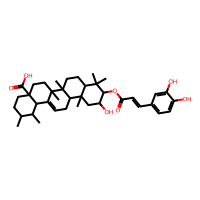

LTS0119373
Prob: 0.51


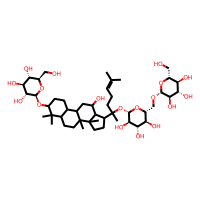

LTS0033515
Prob: 0.50


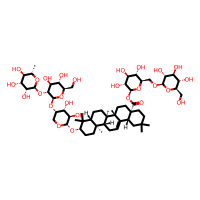

LTS0021226
Prob: 0.55


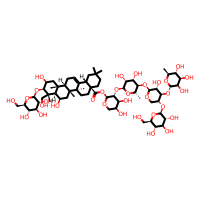

LTS0027021
Prob: 0.59


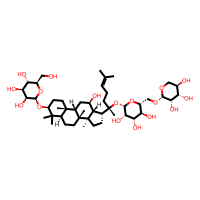

LTS0246367
Prob: 0.51


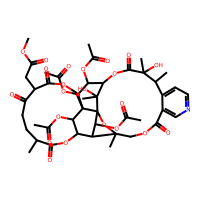

LTS0113948
Prob: 0.53


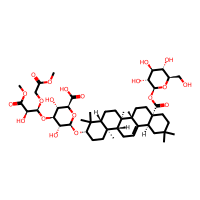

LTS0042614
Prob: 0.62


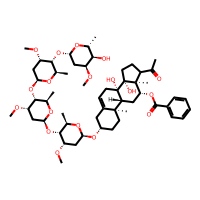

LTS0130109
Prob: 0.53


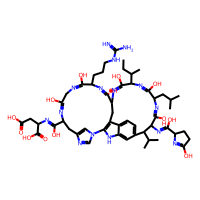

LTS0089791
Prob: 0.53


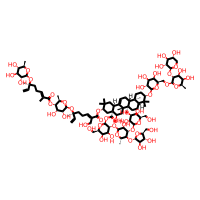

LTS0040571
Prob: 0.58


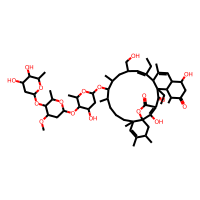

LTS0226210
Prob: 0.60


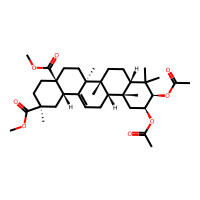

LTS0119235
Prob: 0.52


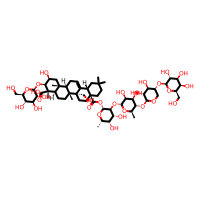

LTS0131923
Prob: 0.64


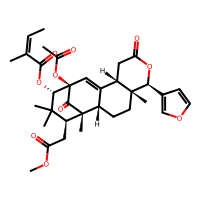

LTS0046774
Prob: 0.52


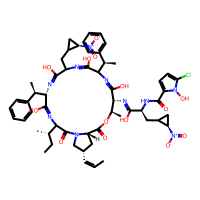

LTS0019856
Prob: 0.61


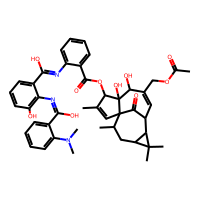

LTS0210141
Prob: 0.56


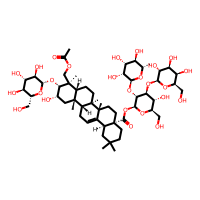

LTS0019771
Prob: 0.54


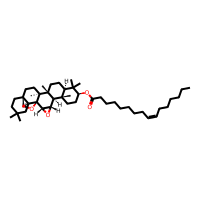

LTS0112700
Prob: 0.52


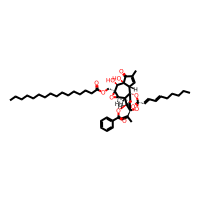

LTS0263801
Prob: 0.57


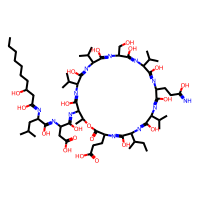

LTS0113507
Prob: 0.54


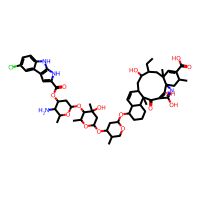

LTS0038798
Prob: 0.53


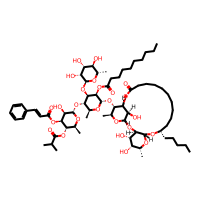

LTS0033347
Prob: 0.53


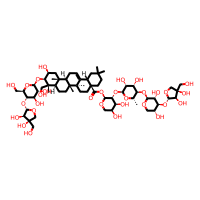

LTS0258251
Prob: 0.63


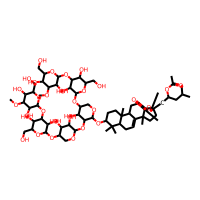

LTS0237485
Prob: 0.54


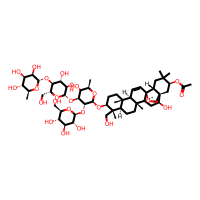

LTS0049358
Prob: 0.54


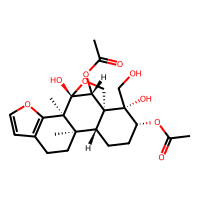

LTS0033529
Prob: 0.55


In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw

# Create molecule objects from SMILES
molecules = [Chem.MolFromSmiles(smile) for smile in ACTIVES['SMILES']]

# Generate labels combining `npaid` and `Probability`
legends = [f"{npaid}\nProb: {prob:.2f}" for npaid, prob in zip(ACTIVES['Name'], ACTIVES['Probability'])]

# Display molecules one by one
for mol, legend in zip(molecules, legends):
    if mol:  # Ensure the molecule is valid
        img = Draw.MolToImage(mol, size=(200, 200))
        display(img)
        print(legend)  # Print the legend below each molecule
